# Fragestellung

Für unser Projekt stellen wir uns die Frage, wie man als Privatperson am besten einen Trip nach Chicago plant, sodass die Wahrscheinlichkeit in ein Verbrechen verwickelt zu werden 
am Niedrigsten ist.  
Chicago gilt als sehr unsichere Stadt, also wollen wir Leuten, die nach Chicago reisen wollen, einige auf Statistiken basierende Tipps geben, um nicht in Verbrechen verwickelt zu werden.  
Wir orientierten uns im Allgemeinen am Crisp-DM Prozess um einen strukturierten Projektablauf durchführbar zu machen.

# Business Understanding

Um ein wertvolles Ergebnis zu unserer Fragestellung zu erhalten sind die Fragen, die wir uns hauptsächlich stellen:  
    1. In welchen Regionen von Chicago ist es am gefährlichsten?  
    2. Zu welcher Tageszeit ist es am sichersten sich aus seiner Unterkunft heraus zu begeben?  
    3. In welchen Monaten sollte man nach Chicago reisen, um Verbrechen am besten zu vermeiden?  
    4. Ist Chicago in den letzten Jahren "sicherer" geworden?
    5. Vor welchen Verbrechen sollte ich besonders Ausschau halten?  
    
Daten, die Ortschaften, Zeiten sowie Verbrechensart enthalten, sind für uns also am relevantesten.

# Data Understanding
Zuerst importieren wir die benötigten Bibliotheken.

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium as fl
import os
from datetime import datetime
from folium.plugins import HeatMap
from folium.plugins import DualMap

Wir haben uns für einen Datensatz entschieden, der vom Chicago Police Department zur Verfügung gestellt wird. Grund dafür ist die Verlässlichkeit der Quelle und die Vielzahl an für uns relevanten Daten.  
Als erstes lesen wir den Datensatz ein, und schauen uns den Aufbau der Daten an:  

In [ ]:
chicago_crime_data = pd.read_csv('crimes-chicago-dataset.csv')

#Datentypen abspeichern
datentypen = chicago_crime_data.dtypes.rename("Datentyp:")

#Für jeden Datentyp wird ein Wert abgespeichert
beispielDaten = chicago_crime_data.iloc[2].rename("Beispiel:")

#Kombiniert die Datentypen mit ihrem jeweiligen Beispielswert
datentyp_beispiel = pd.concat([datentypen, beispielDaten], axis=1)
print(datentyp_beispiel)
print('Der Datensatz hat',chicago_crime_data.shape[1],'Spalten und',chicago_crime_data.shape[0],'Zeilen.' )

                     Datentyp:                               Beispiel:
ID                       int64                                13203321
Case Number             object                                JG415333
Date                    object                  09/06/2023 05:00:00 PM
Block                   object                        002XX N Wells st
IUCR                    object                                    1320
Primary Type            object                         CRIMINAL DAMAGE
Description             object                              TO VEHICLE
Location Description    object  PARKING LOT / GARAGE (NON RESIDENTIAL)
Arrest                    bool                                   False
Domestic                  bool                                   False
Beat                     int64                                     122
District               float64                                     1.0
Ward                   float64                                    42.0
Commun

Hieraus können wir folgende, für uns weitergehend wichtige Erkenntnisse ziehen:
1. Wir wissen unser Code hat 7931583 Einträge mit 22 Datenspalten.
2. Wir haben eine Vorstellung davon, welche Daten wir vorliegen haben, um unser weiteres Vorgehen zu planen.
3. Wir wissen, wie unsere Merkmalsausprägungen skaliert sind (die meisten nominal, aber z.B. die Spalte "Description" ist ordinal skaliert.)
4. Wir können einordnen in welchen Datentypen die jeweiligen Daten gespeichert sind, und wissen, wie wir weiter mit diesen vorgehen müssen.

# Data Preparation
## Data Cleaning
Die meisten Datensätze sind nicht vollständig. Die fehlenden Felder können zum Beispiel entweder fehlender Sorgfalt beim Füllen des Datensatzes von Menschen geschuldet sein, oder manche Daten sind einfach nicht verfügbar. 

Die Anzahl dieser fehlenden Datenstellen können wir mit isnull().sum() auslesen. Außerdem berechnen wir für ein besseres Verständnis die Prozentzahl von Daten, die fehlen:

In [ ]:
null_daten_count = chicago_crime_data.isnull().sum() #zählt Anzahl an NaN Werten pro Spalte
null_stellen_count = null_daten_count.sum() #zählt Anzahl an Daten die insgesamt fehlen
daten_stellen_Insg = chicago_crime_data.shape[0]*chicago_crime_data.shape[1] #zur Darstellung mit print 
prozent_fehlend = round(100 * null_stellen_count / daten_stellen_Insg, 2)

print("Insgesamt fehlen " + str(null_stellen_count) + " von " + str(daten_stellen_Insg) + " (" + str(prozent_fehlend) + "%) Daten")
print("Pro Spalte fehlen: ")
print(null_daten_count)

Insgesamt fehlen 1687043 von 174479250 (0.97%) Daten
Pro Spalte fehlen: 
ID                           0
Case Number                  0
Date                         0
Block                        0
IUCR                         0
Primary Type                 0
Description                  0
Location Description     12001
Arrest                       0
Domestic                     0
Beat                         0
District                    47
Ward                    614853
Community Area          613477
FBI Code                     0
X Coordinate             89333
Y Coordinate             89333
Year                         0
Updated On                   0
Latitude                 89333
Longitude                89333
Location                 89333
dtype: int64


Fehlende Werte (NaN) im Datensatz können manche Auswertungen erschweren oder sogar unmöglich machen. Unser Datensatz hat 7,9 Millionen Reihen, deshalb können wir ohne Probleme Reihen mit NaN löschen, ohne die Statistische Relevanz der Auswertung zu verlieren. Deshalb löschen wir mit .dropna() alle Reihen aus unserem Datensatz, die mindestens ein NaN haben: 

In [ ]:
data_cleaned = chicago_crime_data.dropna(ignore_index='true')

Nun sollten im neuen Dataframe data_cleaned 0 Reihen vorhanden sein, die mindestens ein NaN enthalten:

In [ ]:
#Berechnung der Anzahl von Feldern ohne Wert
null_stellen_count = data_cleaned.isnull().sum().sum() #zählt Anzahl an Daten die insgesamt fehlen
daten_stellen_Insg = data_cleaned.shape[0]*data_cleaned.shape[1] #zur Darstellung mit print 
prozent_fehlend = round(100 * null_stellen_count / daten_stellen_Insg, 2) #Berechnung der Prozentzahl

print("Nun fehlen " + str(null_stellen_count) + " von " + str(daten_stellen_Insg) + " (" + str(prozent_fehlend) + "%) Daten")

#Berechnung der Anzahl an Reihen gesamt, die ohne Wert waren
prozent_reihen_uebrig = round(100 * data_cleaned.shape[0] / chicago_crime_data.shape[0], 2)

print("Der Datensatz hat nach dem Data Cleaning noch " + str(data_cleaned.shape[0]) + "/" + str(chicago_crime_data.shape[0]) + " (" + str(prozent_reihen_uebrig) + "%) Reihen")

Nun fehlen 0 von 159000028 (0.0%) Daten
Der Datensatz hat nach dem Data Cleaning noch 7227274/7930875 (91.13%) Reihen


*Die Anzahl an Reihen ist dabei mehr als 1 Prozent gesunken, da pro fehlender Wert die gesamte Reihe an Daten (22 Datenfelder) gelöscht wird, nicht nur das fehlende Datenfeld*

## Ausschließung von häuslichen Verbrechen
Da wir mit unserer Auswertung herausfinden wollen, wo ein Urlaubstrip nach Chicago am sichersten ist, können wir alle Verbrechen aus dem Datensatz herausfiltern, die nicht in der Öffentlichkeit geschehen sind. Häusliche Verbrechen betreffen uns als Urlauber schließlich eher nicht.

In [ ]:
crimes_public = data_cleaned.loc[data_cleaned['Domestic'] == False]

#Prozent Berechnung der Übrigen Reihen nach Ausschluss von häuslichen Verbrechen
prozent_reihen_uebrig = round(100 * crimes_public.shape[0] / data_cleaned.shape[0], 2)
print("Der Datensatz hat nach Ausschließung der häuslichen Verbrechen noch " + str(crimes_public.shape[0]) + "/" + str(data_cleaned.shape[0]) + "(" + str(prozent_reihen_uebrig) + "%) Reihen vom vorher gesäuberten Datensatz übrig")
data_cleaned = crimes_public

Der Datensatz hat nach Ausschließung der häuslichen Verbrechen noch 5975020/7227274(82.67%) Reihen vom vorher gesäuberten Datensatz übrig


# Modeling

## Heatmap von Chicago

Große Städte verändern sich ständig. Stadtmittelpunkte, Touristenattraktionen und andere Orte von Menschenansammlungen verändern und verschieben sich, wenn neue Orte ausgebaut werden und alte Geschäfte/Viertel geschlossen werden. Deswegen werden wir für die Heatmap nur die Verbrechen beachten, die dieses Jahr geschehen sind. Dieser Zeitraum wurde so gewählt, weil so in den vergangenen 11 Monaten genügend Daten angefallen sind und die Geodaten aber trotzdem aktuell genug sein sollten, um verlässliche Aussagen über die Sicherheit der Orte zu treffen. Außerdem sind die Daten so weniger stark beeinflusst von den temporär veränderten Öffentlichkeitsaufhalten der Bevölkerungen durch die Covid 19 Pandemie und deren Lockdowns, da im Jahr 2023 generell die meisten Beschränkungen aufgehoben wurden. 

Wir erstellen also ein neues Dataframe, in dem nur die im Jahr 2023 geschehenen Verbrechen enthalten sind:

In [ ]:
crimes_2023 = data_cleaned.loc[data_cleaned['Year'] == 2023]

### Kartenerstellung
Wir beginnen, indem wir ein neues Kartenobjekt mit dem Namen "karte_Chicago" erstellen, dessen Mittelpunkt eine Koordinate in Chicago ist. Außerdem erstellen wir einen Ordner (falls dieser nicht bereits existiert), in dem wir alle Karten speichern werden:

In [ ]:
karte_Chicago = fl.Map(location = [41.863474, -87.613654], zoom_start = 11, control_scale=True,)
os.makedirs('Karten', exist_ok=True)

#Karte ausgeben und speichern
karte_Chicago.save('Karten/Chicago_Karte.html')

Nun werden die Latitude und Longitude Koordinatenpaare jedes im Datenframe "data_cleaned" vorkommenden Verbrechen (siehe oben für eine Liste der darin ausgeschlossenen Verbrechen) im Array lats_long gespeichert. Daraus können wir dann eine Heatmap erstellen, in der alle in der Öffentlichkeit im Jahr 2023 passierten Verbrechen gezeigt werden. Durch die Zoom Funktion besteht auch die Möglichkeit, mit simplen Mausbewegungen einzelne Häuserblöcke und Straßen mit den dort geschehenen Verbrechen anzusehen.

In [ ]:
lat_long = crimes_2023[['Latitude', 'Longitude']].values.tolist()
karte_Chicago_Heatmap = karte_Chicago #Referenzkopie der leeren Karte
HeatMap(lat_long, radius=(30), blur=(28),).add_to(karte_Chicago_Heatmap)

#Karte ausgeben und speichern
karte_Chicago_Heatmap.save('Karten/Chicago_Heatmap.html')
karte_Chicago_Heatmap

Aus der Verteilung der Verbrechen in Chicago kann man den Schluss ziehen, das es in dichter besiedelten Gebieten mehr Verbrechen gibt. Um dies zu bestätigen, können wir mit der Folium Library auch einen Vergleich der Heatmap mit einer leeren Satellitenkarte herstellen.

### Vergleich mit Satellitenbildern
Dafür erstellen wir zuerst ein neues Folium DualMap Kartenobjekt "vergleich":

In [ ]:
vergleich = fl.plugins.DualMap(location=(41.849429, -87.597334), tiles=None, zoom_start=11, control_scale=True,)

Daraufhin erstellen wir die zwei untergeordneten Kartenobjekte m1 und m2, die zum Dualmap Kartenobjekt "vergleich" gehören. Als Kartenquelle fügen wir für beide Karten die API der Satellitenkarte "Esri World Imagery" ein, die frei verfügbar ist:

https://www.arcgis.com/home/item.html?id=10df2279f9684e4a9f6a7f08febac2a9

In [ ]:
fl.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Esri World Imagery',
).add_to(vergleich.m1);
fl.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Esri World Imagery',
).add_to(vergleich.m2);

Nun fügen wir wie oben die im Array "lats_longs" gespeicherten Koordinaten der Verbrechen als Heatmap zur "m1" Karte hinzu und zeigen die neue "vergleich" Karte danach an:

In [ ]:
HeatMap(lat_long, radius=(30), blur=(28)).add_to(vergleich.m1)
#Steuerungsobjekte hinzufügen
fl.LayerControl(collapsed=True, show=False).add_to(vergleich)

#Karte ausgeben und speichern
vergleich.save('Karten/Chicago_Vergleich_Heatmap_Satellit.html')
vergleich

Es ist erkennbar, dass an manchen Orten die Bebauungsdichte mit der Verbrechenshäufigkeit korreliert. Besonders in Downtown Chicago ist das der Fall. Auf dem Rest der Karte ist diese Korrelation aber meist nicht aufzufinden. Deshalb kann man nicht generell sagen, dass eine hohe Bebauungsdichte (und somit in der Regel auch eine hohe Bevölkerungsdichte) immer zu einer erhöhten Verbrechenshäufigkeit führt.

### Anwendung auf bestimmte Reiseziele
Um nun konkretere Reiseempfehlungen treffen zu können, sollte man interessante Reiseziele oder Hotels erst in dieser Karte aufsuchen, um deren Sicherheit zu bestimmen. Als Beispiel fügen wir einige Hotels mit deren Koordinaten in der Karte als Marker ein:

In [ ]:
#Refernenzkopie der Karte auf ein neues Kartenobjekt, Zentrieren auf die Koordinaten von Hotel 2
marker_Chicago_Heatmap = karte_Chicago_Heatmap
marker_Chicago_Heatmap.zoom_start= 11
marker_Chicago_Heatmap.location= [41.88612445681384, -87.63367468354781]

#Hotelmarker hinzufügen
fl.Marker(
    location=[41.895194867728925, -87.61606169978471],
    tooltip="W Chicago - Lakeshore",
    popup="https://maps.app.goo.gl/kRhLEB6UwdkJGLiJA",
    icon=fl.Icon(color="red", icon="1", prefix='fa',),).add_to(marker_Chicago_Heatmap);
fl.Marker(
    location=[41.88612445681384, -87.63367468354781],
    tooltip="The Allegro Royal Sonesta Hotel Chicago Loop",
    popup="https://maps.app.goo.gl/eNWMsavhf1eFtzj47",
    icon=fl.Icon(color="red", icon="2", prefix='fa',),).add_to(marker_Chicago_Heatmap);
fl.Marker(
    location=[41.8378989795599, -87.65697241489531],
    tooltip="The Polo Inn Bed & Breakfast",
    popup="https://maps.app.goo.gl/U61Rx65AYDoEDjsu9",
    icon=fl.Icon(color="red", icon="3", prefix='fa',),).add_to(marker_Chicago_Heatmap);

#Karte ausgeben und speichern
marker_Chicago_Heatmap.save('Karten/Chicago_Heatmap_Marker.html')
marker_Chicago_Heatmap

Durch einen Klick mit dem Mauszeiger kann auch direkt auf der Karte der Name des Hotels und der entsprechende Google Maps link eingesehen werden. Da aber nicht jeder die Karte interaktiv zur Hand haben wird, sind hier auch noch einmal die Informationen sowie die Sicherheitseinschätzung des Gebiets dem Datensatz zufolge aufgelistet:

1: Das "W Chicago - Lakeshore" Hotel ist offensichtlich keine gute Wahl, da der roten Umgebungsfarbe nach zu urteilen die Umgebung nicht sehr sicher ist.  
2: Das "The Allegro Royal Sonesta Hotel Chicago Loop" Hotel liegt in einem sehr roten Bereich, deshalb ist dem Datensatz nachzuschließen auch dieses Hotel und der umliegende Bereich zu meiden.  
3: Das "The Polo Inn Bed & Breakfast" Hotel dagegen ist im Vergleich zum Rest von Chicago in einem sichereren Bereich, und ist deshalb dem Datensatz zufolge zu empfehlen

### Anwendung auf andere Hotels/Reiseziele
#### Manuelle Verwendung der Karte
Um ein anderes Hotel einschätzen zu können, müssen folgende Schritte befolgt werden:  
1: Ein Hotel auf einem Kartedienst finden (z.B. Google Maps)  
2: Das Hotel visuell auf der Heatmap aufsuchen und die Röte des Gebiets im Vergleich zum Rest der Heatmap begutachten  
3: Je nach Tiefe der Röte entscheiden, ob der Ort den Sicherheitsanforderungen entspricht  


#### Abfragen basierte Verwendung der Karte
Wie im Kapitel Deployment beschrieben, ist auch eine interaktive Verwendung möglich.


## Sichere Tageszeiten?

Hier stellen wir die jeweiligen Tageszeiten, zu denen Verbrechen geschehen sind, als Histogramm dar.
Wir müssen zuerst die Date Spalte von Objects zu Datetimes konvertieren, um dann mit diesen einen Plot erstellen zu können, indem wir aus der Datetime direkt die Stunde rausziehen.

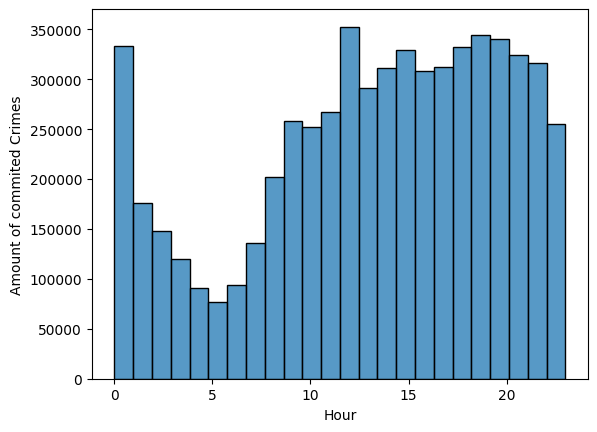

In [ ]:
#Umformatierung der Daten zu Datetimes
data_cleaned['Date'] = pd.to_datetime(data_cleaned['Date'], format='%m/%d/%Y %I:%M:%S %p')
day_of_month_chicago_crime_data = data_cleaned['Date'].dt.hour
fig = sns.histplot(day_of_month_chicago_crime_data, kde=False, bins=24)
fig.set(xlabel='Hour', ylabel='Amount of commited Crimes');

Im Histogramm können wir nun die Tageszeiten der begangenen Verbrechen sehen.
Man sieht deutlich, dass nachts (5 Uhr) am wenigsten Verbrechen geschehen, und diese fast stetig bis 18 Uhr zunehmen, und diese Anzahl sich wieder bis 5 Uhr verringert. Ausnahme davon sind 0 und 12 Uhr, unsere Vermutung hier ist, dass Verbrechen, bei denen nur eine ungefähre Uhrzeit zur Verfügung stand, entweder auf 0 oder auf 12 Uhr ab/aufgerundet wurden.

Auf ersten Blick würde man also denken, dass die sicherste Tageszeit für einen Trip die Nacht wäre, aber da nachts normalerweise weniger Menschen aktiv sind, ist diese Statistik etwas trügerisch.
Unser Fazit hier ist, dass wir aus diesem Histogramm leider keine erkenntliche Einsicht über eine empfehlenswerte Tageszeit zum Rausgehen gewinnen können.

## Sichere Jahreszeiten?

Wir fangen an, indem wir eine Methode definieren, die uns die Jahreszeit je nach Monat angibt.
Danach erstellen wir eine neue Spalte, die uns die Jahreszeit des jeweiligen Verbrechens zurückgibt.
Wir erstellen daraufhin ein Balkendiagramm, dass uns eine visuelle Übersicht über die jeweilige Jahreszeit gibt.


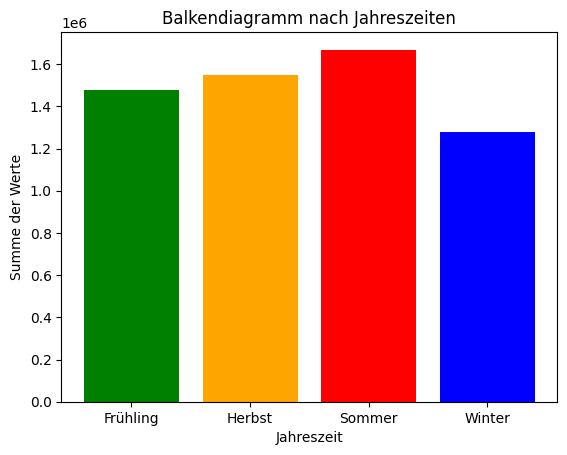

In [ ]:
def get_season(date):
    month = date.month
    if 3 <= month <= 5:
        return "Frühling"
    elif 6 <= month <= 8:
        return "Sommer"
    elif 9 <= month <= 11:
        return "Herbst"
    else:
        return "Winter"

data_cleaned['Jahreszeit'] = data_cleaned['Date'].apply(get_season)

chicago_crime_data_grouped = data_cleaned.groupby('Jahreszeit')['Case Number'].size()

plt.bar(chicago_crime_data_grouped.index, chicago_crime_data_grouped.values, color=['green', 'orange', 'red', 'blue'])
plt.title('Balkendiagramm nach Jahreszeiten')
plt.xlabel('Jahreszeit')
plt.ylabel('Summe der Werte')
plt.show()

Man kann deutlich sehen, dass die Anzahl der Verbrechen im Vergleich zu den Anderen Jahreszeiten im Winter stark sinkt, während im Sommer mehr Verbrechen geschehen.
Für einen Trip nach Chicago würde sich also definitiv der Winter anbieten!

## Klassifizierung der Verbrechen
### Klassifizierung

In unserem Datensatz sowie im echten Leben gibt es viele verschiedene Verbrechenskategorien. Diese variieren von vergleichsweise harmlosen Gesetzesverstößen wie Taschendiebstahl bis hin zu schweren Verbrechen wie Mord. Nicht alle Verbrechen betreffen uns aber als Urlauber in Chicago. 'LIQUOR LAW VIOLATION', d.h. ein Spirituosen Gesetzes Verstoß betrifft und als Urlauber nicht, obwohl es durchaus für die Stadt ein größeres Problem darstellen könnte. Deshalb teilen wir die vielen verschiedenen Verbrechensarten in die zwei Kategorien schwerwiegend_Urlaub und belanglos_Urlaub ein. Besonders schwerwiegende Verbrechen, wie zum Beispiel solche, die schwere Sach-, Personen- oder psychische Schäden verursachen werden und von welchen wir als Urlauber ebenfalls potenziell betroffen sein könnten, werden als schwerwiegend eingestuft, Verbrechen die eher geringfügige Schäden verursachen werden hingegen als weniger schwerwiegend eingestuft.

Dazu rufen wir zunächst alle einzigartigen Verbrechensarten in der Kategorie 'Primary Type' auf und geben die daraus resultierende Liste mit print() aus:

In [ ]:
unique_types = data_cleaned['Primary Type'].unique()
print(unique_types)

['CRIMINAL DAMAGE' 'DECEPTIVE PRACTICE' 'CRIMINAL SEXUAL ASSAULT' 'THEFT'
 'ROBBERY' 'SEX OFFENSE' 'WEAPONS VIOLATION' 'STALKING'
 'MOTOR VEHICLE THEFT' 'CRIMINAL TRESPASS' 'BATTERY' 'OTHER OFFENSE'
 'HOMICIDE' 'PROSTITUTION' 'BURGLARY' 'ASSAULT' 'NARCOTICS' 'KIDNAPPING'
 'ARSON' 'CONCEALED CARRY LICENSE VIOLATION'
 'INTERFERENCE WITH PUBLIC OFFICER' 'PUBLIC PEACE VIOLATION'
 'OFFENSE INVOLVING CHILDREN' 'LIQUOR LAW VIOLATION' 'INTIMIDATION'
 'GAMBLING' 'OBSCENITY' 'HUMAN TRAFFICKING' 'CRIM SEXUAL ASSAULT'
 'OTHER NARCOTIC VIOLATION' 'PUBLIC INDECENCY' 'RITUALISM' 'NON-CRIMINAL'
 'NON-CRIMINAL (SUBJECT SPECIFIED)' 'NON - CRIMINAL']


Nach einiger Überlegung und Evaluation stufen wir nun die folgenden Verbrechen als schwerwiegend für Urlauber ein: 'THEFT', 'ASSAULT', 'WEAPONS VIOLATION','SEX OFFENSE','CRIM SEXUAL ASSAULT','MOTOR VEHICLE THEFT','CRIMINAL TRESPASS','ROBBERY','PUBLIC PEACE VIOLATION','CRIMINAL SEXUAL ASSAULT','HOMICIDE', 'KIDNAPPING' und 'HUMAN TRAFFICKING'. Diese werden in der Liste schwerwiegend_Urlaub als Zeichenkette gespeichert:

In [ ]:
schwerwiegend_Urlaub = ['THEFT', 'ASSAULT', 'WEAPONS VIOLATION','SEX OFFENSE','CRIM SEXUAL ASSAULT','MOTOR VEHICLE THEFT','CRIMINAL TRESPASS','ROBBERY','PUBLIC PEACE VIOLATION','CRIMINAL SEXUAL ASSAULT','HOMICIDE', 'KIDNAPPING','HUMAN TRAFFICKING']

Jetzt werden die Verbrechen im gesamten Datensatz bewertet und als "Schwerwiegend" oder "Nicht Schwerwiegend" entsprechend eingestuft. 

Dazu erstellen wir die Methode "klassifizieren". Diese nimmt als Parameter einen 'crime_type' String. Wenn dieser Parameter in der Liste schwerwiegende_verbrechen enthalten ist, gibt die Methode 'Schwerwiegend' aus, wenn nicht wird 'Nicht Schwerwiegend' ausgegeben: 

In [ ]:
def klassifizieren(crime_type):
    if crime_type in schwerwiegend_Urlaub:
        return 'Schwerwiegend'
    else:
        return 'Nicht Schwerwiegend'


data_cleaned['Schwere Klassifizierung'] = data_cleaned['Primary Type'].apply(klassifizieren)

### Gruppierung nach Jahren

Um die Analyse durchführen zu können, werden jetzt die Daten nach Jahren gruppiert, und die Anzahl schwerwiegender und nicht schwerwiegender Verbrechen für jedes Jahr summiert.

In [ ]:
gruppe = data_cleaned.groupby(['Year', 'Schwere Klassifizierung']).size().unstack()
gruppe = gruppe.fillna(0)

Diese Daten werden jetzt zur Veranschaulichung in einem Diagramm präsentiert:

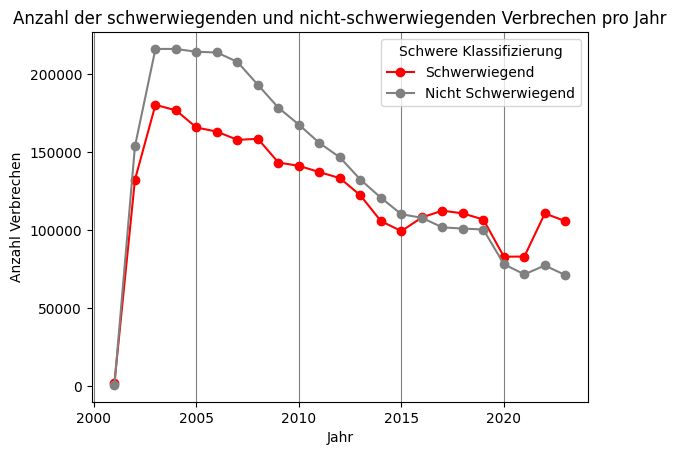

In [ ]:
gruppe['Schwerwiegend'].plot(kind='line', color='red', marker='o', label='Schwerwiegend')
gruppe['Nicht Schwerwiegend'].plot(kind='line', color='gray', marker='o', label='Nicht Schwerwiegend')
plt.title('Anzahl der schwerwiegenden und nicht-schwerwiegenden Verbrechen pro Jahr')
plt.grid(axis='x', color='0.5')
plt.xlabel('Jahr')
plt.ylabel('Anzahl Verbrechen')
plt.legend(title='Schwere Klassifizierung')
plt.show()

Es ist zu erkennen, dass die Gesamtzahl an Verbrechen sich stark reduziert hat. Aber es ist nicht wegzulassen, dass im Jahr 2022 die Anzahl an für Urlauber relevante Verbrechen stark gewachsen ist. Außerdem sind 2016 zum ersten Mal mehr Schwerwiegende als nicht Schwerwiegende Verbrechen passiert.

Diesen Ergebnis wird nochmal tiefer untersucht, um zu sehen welche konkrete verbrechen am meisten zugenommen haben.

In [ ]:
schwere_verbrechen_2021 = data_cleaned[
    (data_cleaned['Schwere Klassifizierung'] == 'Schwerwiegend') &
    (data_cleaned['Year'] == 2021)
]
schwere_verbrechen_2022 = data_cleaned[
    (data_cleaned['Schwere Klassifizierung'] == 'Schwerwiegend') &
    (data_cleaned['Year'] == 2022)
]

Daraufhin werden davon die Schwerwiegenden Verbrechen gruppiert und extrahiert. Die nicht Schwerwiegenden werden ignoriert.

In [ ]:
schwere_verbrechen_2021_anzahl = schwere_verbrechen_2021.groupby('Primary Type').size().sort_values(ascending=False)
schwere_verbrechen_2022_anzahl = schwere_verbrechen_2022.groupby('Primary Type').size().sort_values(ascending=False)

Zuletzt wird für jede Art Schwerwiegender Verbrechen die Zunahme berechnet und die Ergebnisse in einem Diagramm gezeigt.

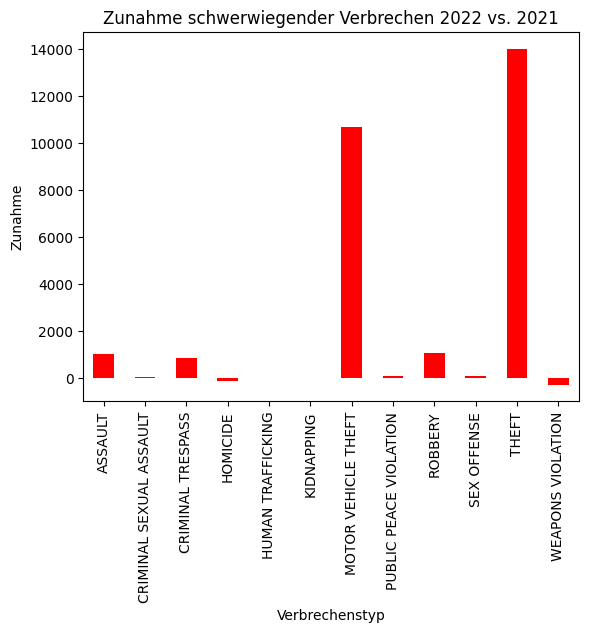

In [ ]:
zunahme_schwere_verbrechen_2022_vs_2021 = schwere_verbrechen_2022_anzahl - schwere_verbrechen_2021_anzahl
zunahme_schwere_verbrechen_2022_vs_2021.plot(kind='bar', color='red')
plt.title('Zunahme schwerwiegender Verbrechen 2022 vs. 2021')
plt.xlabel('Verbrechenstyp')
plt.ylabel('Zunahme')
plt.xticks(rotation=90)
plt.show()

Es ist klar zu erkennen, dass Verbrechen, die mit Diebstahl zu tun haben, im Jahr 2022 stark gewachsen sind.

### Schlussfolgerungen und Implikationen:
Nach der durchgeführten Analyse ist zu schlussfolgern, dass die Anzahl der gemeldeten Straftaten seit 2001 stark gesunken ist, was eine positive Entwicklung nachweist.
Nichts desto trotz ist die Anzahl der gemeldeten Diebstahlfälle im Jahr 2022 im Vergleich zum Jahr 2021 stark gewachsen, deswegen ist es ratsam, in einem Trip nach Chicago dies bei der Reisevorbereitung zu beachten und wertvolle Gegenstände nicht mit sich mitzunehmen.  
Schlussfolgernd kann man aber sagen, dass Chicago heute viel sicherer ist im Vergleich zu früheren Jahren.

# Evaluation
 Unsere Antworten zu den am Anfang gestellten Fragen sind also wie folgt:  
   1. Aus der Heatmap kann man deutlich die gefährlichsten Ortschaften direkt herauslesen. womit wir eine gute Einschätzung der Gefährlichkeit vornehmen können.
   2. Eine besonders sichere Tageszeit lässt sich nicht direkt erkennen.
   3. Für eine sichere Reise nach Chicago bieten sich die Wintermonate am meisten an.
   4. Verbrechen in Chicago sind über die Jahre deutlich gesunken, die Stadt arbeitet also daran, ihren Ruf zu verbessern!
   5. Als Urlauber sollte man sich vor allem vor Diebstahl in Acht nehmen.
   
# Deployment
Der Großteil unserer Auswertung ist durch Lesen und Anschauen der Diagramme anzuwenden. Ein interaktives Programm würde hier eher weniger Sinn machen. Bei der Heatmap ist es aber durchaus sinnvoll, wenn der Nutzer selbst Orte eingeben kann, um die Sicherheit zu überprüfen.

Deshalb erstellen wir ein Programm, das auf jedem PC, auf dem Python installiert ist, verwendbar ist. Da dabei nicht der Datensatz mit seinen beinahe 2 GB an Daten benötigt wird, speichern wir den dafür nötigen Teil in einer neuen Datenbank in einem neuen Ordner ab:

In [ ]:
os.makedirs('Heatmap_Deployment', exist_ok=True)  
crimes_2023.to_csv('Heatmap_Deployment/deployment_dataset.csv', index=False)

Die neue Datenbank hat nur 50 MB und ist somit besser an Nutzer verteilbar. Die Dokumentation des interaktiven Programms sowie das Programm selbst befindet sich in dem Ordner 'Heatmap_Deployment'.

Das hier beschriebene Programm ist unser Minimum Viable Product (MVP) und ist im späteren Projektverlauf zum Verkauf an Reiseunternehmen und Privatpersonen vorgesehen.